# Project 2

## Helpers

In [ ]:
%matplotlib inline
import cv2
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import numpy as np
from numpy.lib.stride_tricks import as_strided
import PIL
from pandas import DataFrame
import pandas as pd
from IPython.display import display, HTML
from skimage.exposure import rescale_intensity
import json
import os
from itertools import product
import itertools
import random

pd.options.display.html.border = 0
pd.options.display.float_format = '{:,.2f}'.format

%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import cv2
import PIL
import os
import sys
import glob
import random

from pprint import pprint
from ipywidgets import Video

from PIL import Image
from PIL.ExifTags import TAGS, Base

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import os
from sklearn.model_selection import train_test_split
from skimage import io, color, feature, transform
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import csv
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.utils import resample


from tensorflow.keras.preprocessing.image import ImageDataGenerator
from skimage.metrics import structural_similarity

import cv2
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import cv2
import PIL
import os
import sys
import glob
import random

from pprint import pprint
from ipywidgets import Video

from PIL import Image
from PIL.ExifTags import TAGS
from google.colab.patches import cv2_imshow

In [ ]:
def imshow(a):
    a = a.clip(0, 255).astype("uint8")
    if a.ndim == 3:
        if a.shape[2] == 4:
            a = cv2.cvtColor(a, cv2.COLOR_BGRA2RGBA)
        else:
            a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
    display(PIL.Image.fromarray(a))

In [ ]:
import plotly.graph_objects as go


def pix_show(x, y, z, skip_each=1, height=800, width=800, colors=None):
    fig = go.Figure(
        data=[
            go.Scatter3d(
                x=x,
                y=y,
                z=z,
                mode="markers",
                marker={"size": 2, "color": colors, "opacity": 0.7},
            )
        ],
        layout_xaxis_range=[0, 300],
        layout_yaxis_range=[0, 3200],
    )
    scene = {
        "xaxis": dict(title="Blue"),
        "yaxis": dict(title="Green"),
        "zaxis": dict(title="Red"),
    }
    fig.update_layout(
        autosize=False, height=height, width=width, scene=scene, showlegend=True
    )
    fig.show()

## Dice

### Get data

I split screenshots from the videos into 100x100 images using https://pinetools.com/split-image.

examples:

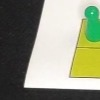
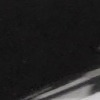
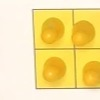

I also took pictures of dice showing different number of dots.

example:

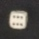
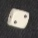
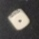

In [4]:
!wget -O DICE.zip https://raw.githubusercontent.com/senketsutsu/CHINCZYK-cv/main/DICE.zip && unzip -q -o DICE.zip

--2025-01-08 14:07:42--  https://raw.githubusercontent.com/senketsutsu/CHINCZYK-cv/main/DICE.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 12052 (12K) [application/zip]
Saving to: ‘DICE.zip’

DICE.zip            100%[===================>]  11.77K  --.-KB/s    in 0.001s  

2025-01-08 14:07:43 (17.5 MB/s) - ‘DICE.zip’ saved [12052/12052]



In [5]:
dice_path = '/content/DICE'

In [6]:
dices = [
    cv2.imread(path, cv2.IMREAD_COLOR) for path in glob.glob("/content/DICE/*.jpg")
]

sample of the dices:

(yes they are in different sizes but we may work on that later...)

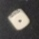

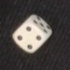

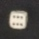

In [7]:
imshow(dices[0])
imshow(dices[1])
imshow(dices[2])

#### Generating more data

In [8]:
datagen = ImageDataGenerator(rotation_range=360,brightness_range=[0.8, 1.5],height_shift_range=0.1
                           ,width_shift_range=0.1,zoom_range=[0.7,1.1])

In [9]:
dices_more = []

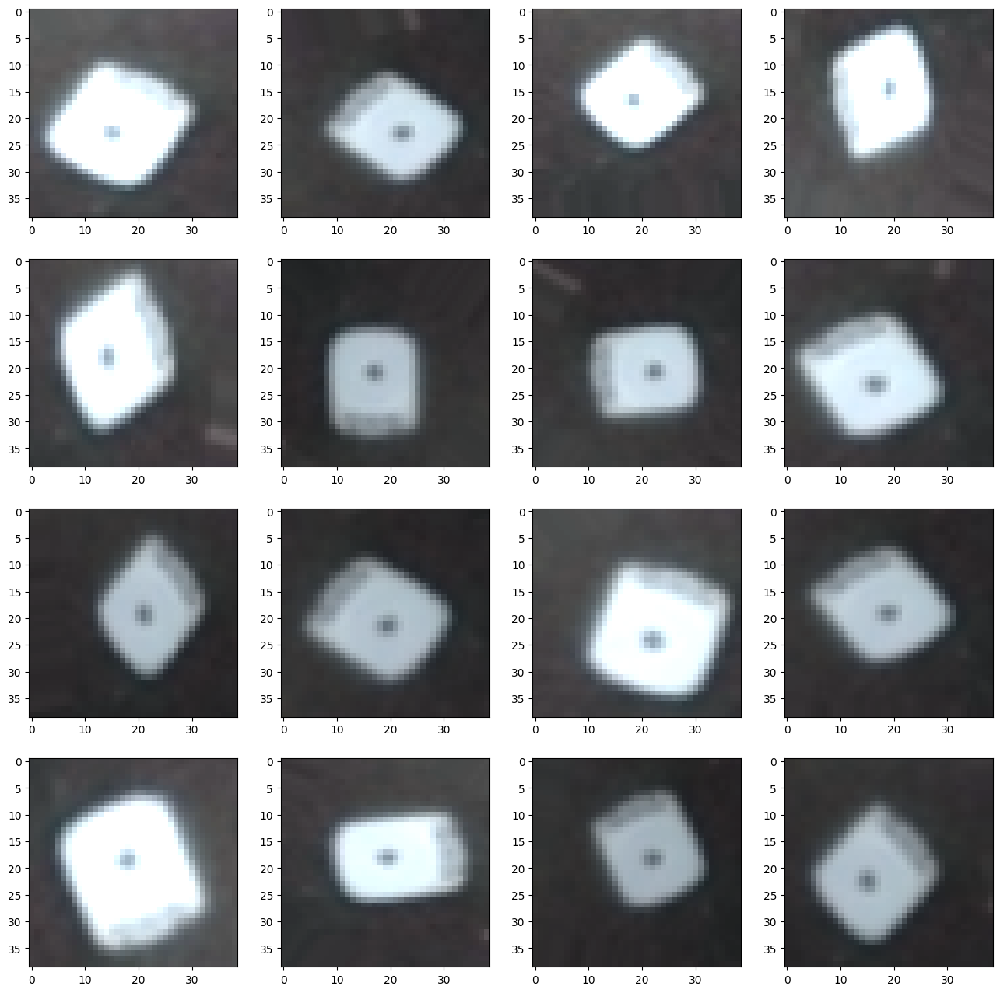

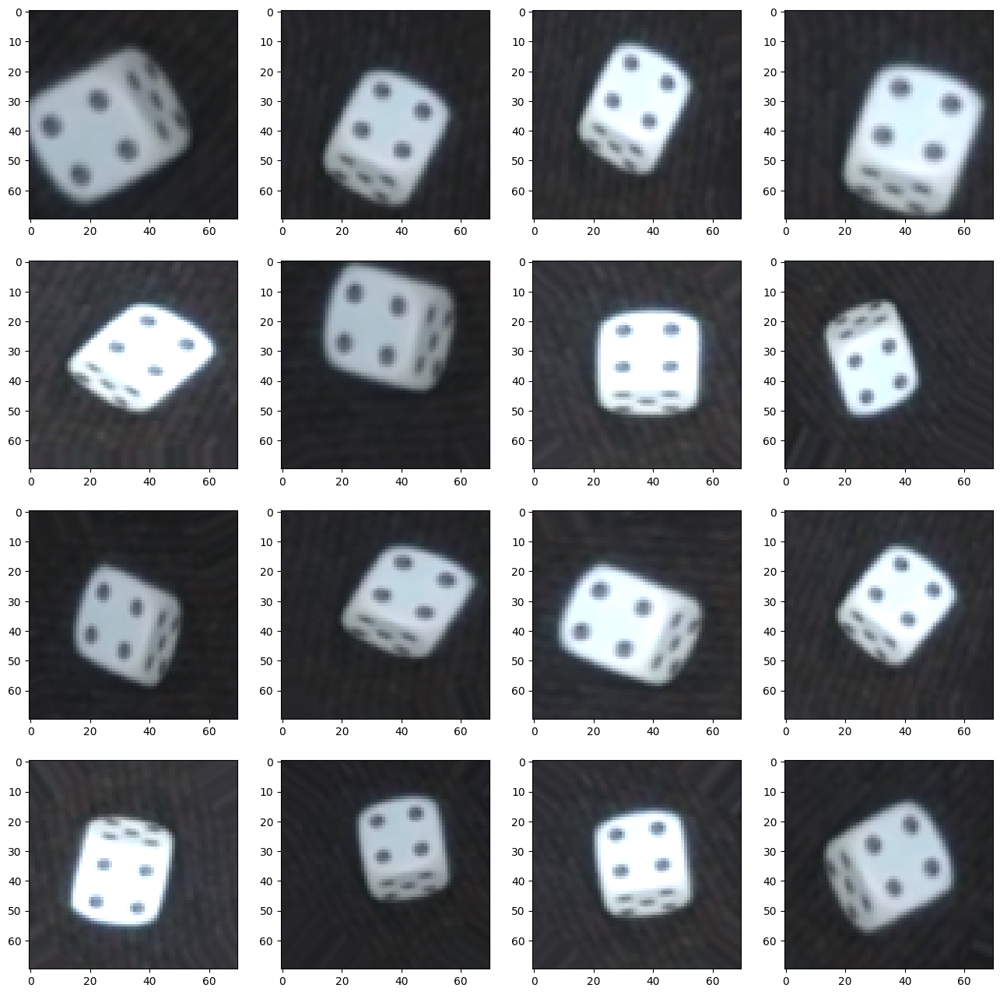

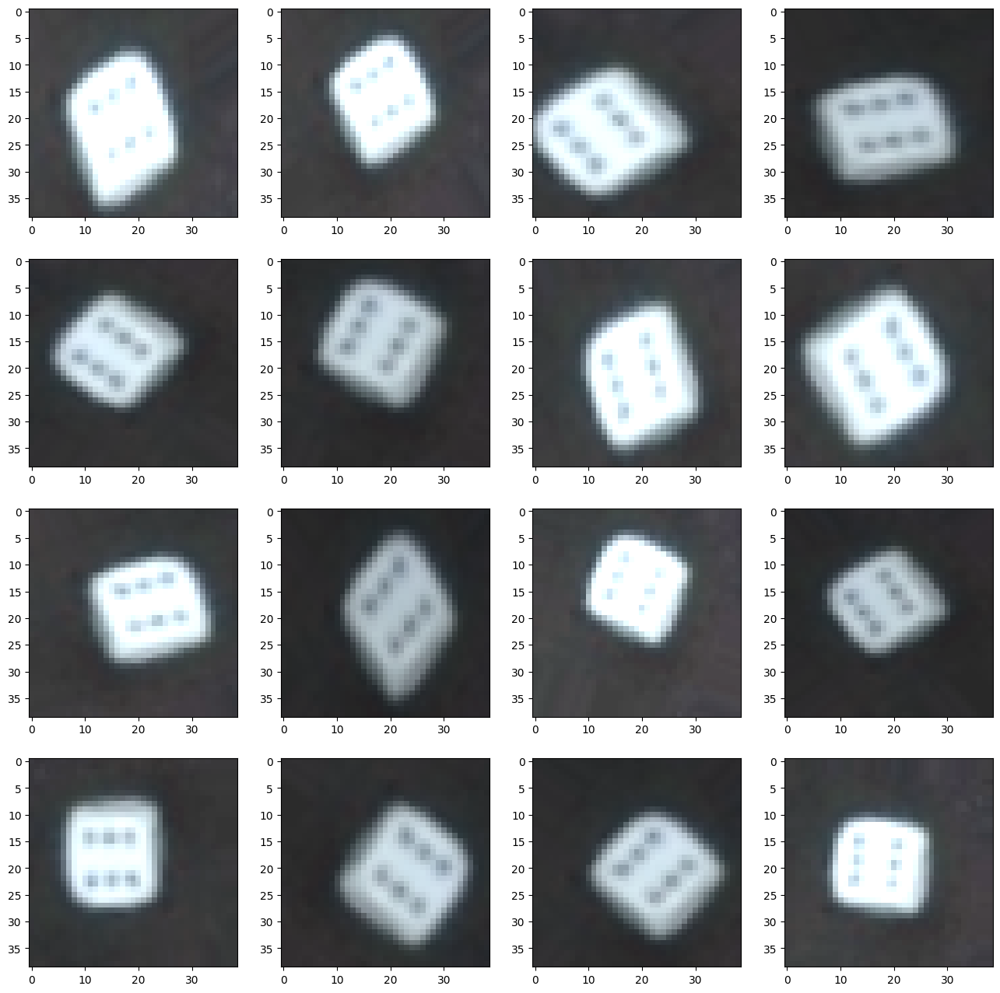

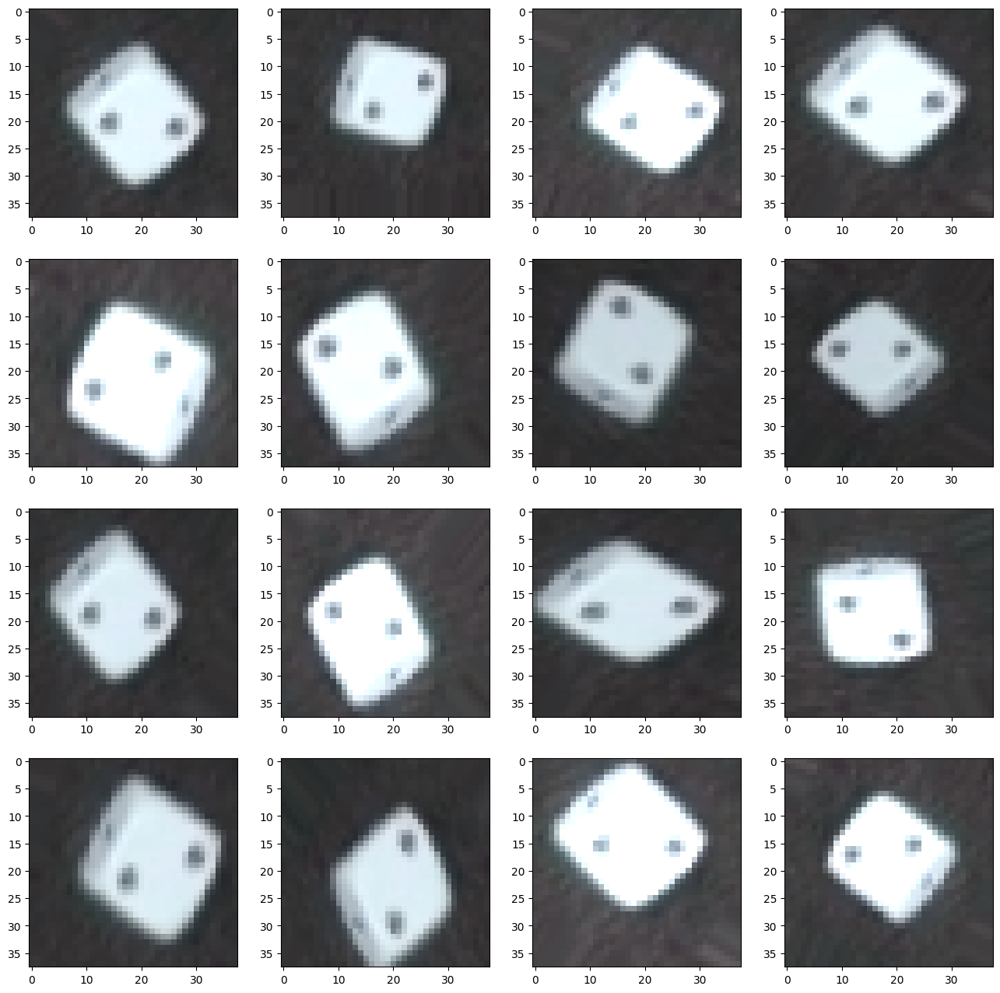

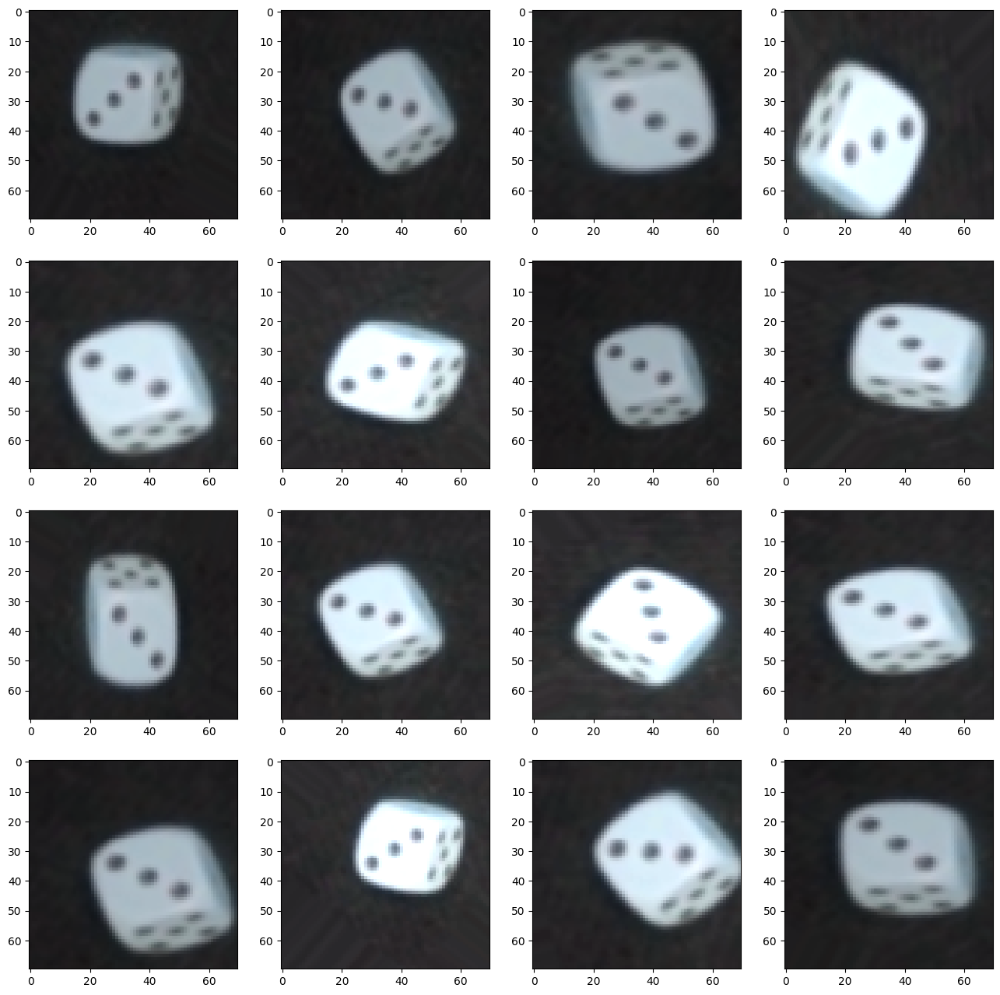

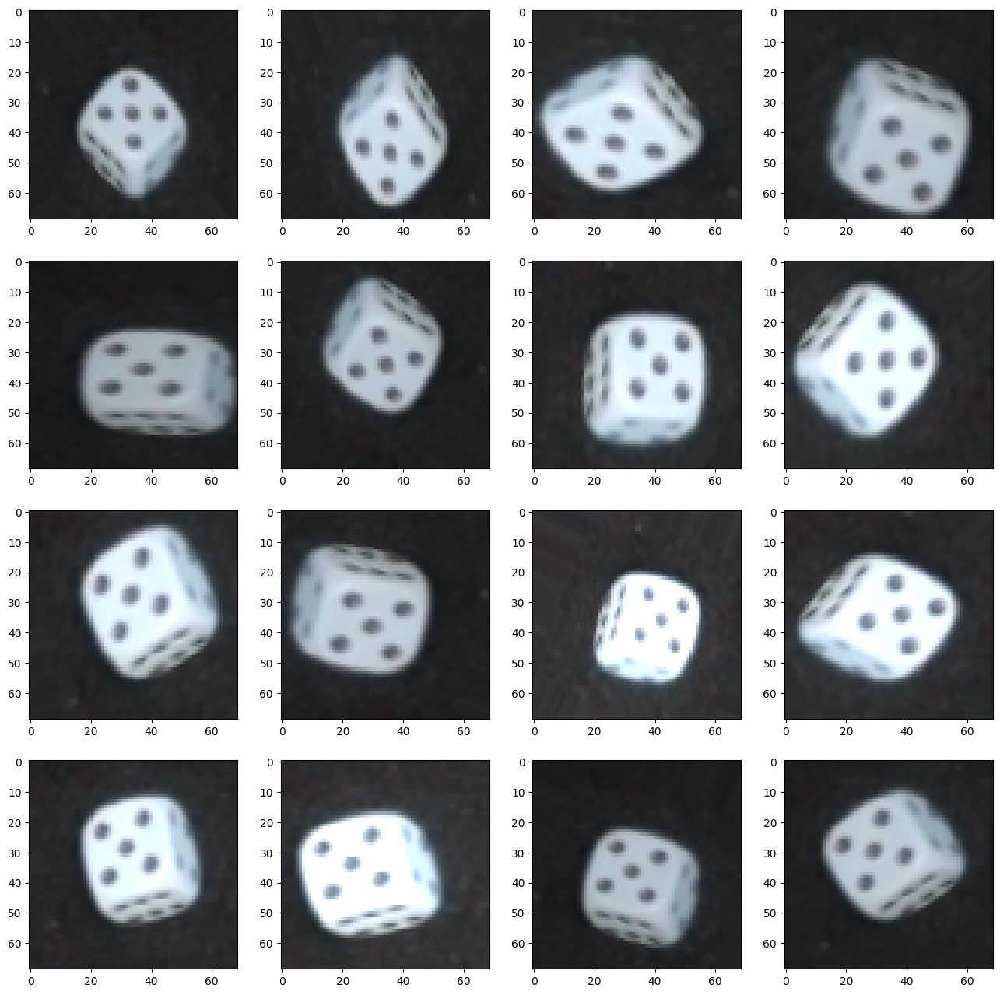

In [10]:
for img in dices:
  img_tensor = tf.keras.preprocessing.image.img_to_array(img)
  img_tensor = np.expand_dims(img_tensor, axis=0)
  pic = datagen.flow(img_tensor, batch_size =1)
  plt.figure(figsize=(16, 16))
  #Plots our figures
  for i in range(1,17):
    plt.subplot(4, 4, i)
    batch = next(pic)
    image_ = batch[0].astype('uint8')
    dices_more.append(image_)
    plt.imshow(image_)
  plt.show()

#### Saving new dices

In [11]:
!rm -rf ./dice
!mkdir dice

for i in range(len(dices_more)):
  filename = '/content/dice/dice'+str(i)+'.jpg'

  # Using cv2.imwrite() method
  # Saving the image
  cv2.imwrite(filename, dices_more[i])

!zip -r /content/dice.zip /content/dice


print('Successfully saved')

updating: content/dice/ (stored 0%)
updating: content/dice/dice22.jpg (deflated 6%)
updating: content/dice/dice24.jpg (deflated 8%)
updating: content/dice/dice72.jpg (deflated 8%)
updating: content/dice/dice15.jpg (deflated 15%)
updating: content/dice/dice64.jpg (deflated 8%)
updating: content/dice/dice18.jpg (deflated 7%)
updating: content/dice/dice87.jpg (deflated 6%)
updating: content/dice/dice69.jpg (deflated 7%)
updating: content/dice/dice70.jpg (deflated 8%)
updating: content/dice/dice21.jpg (deflated 7%)
updating: content/dice/dice83.jpg (deflated 7%)
updating: content/dice/dice5.jpg (deflated 16%)
updating: content/dice/dice92.jpg (deflated 7%)
updating: content/dice/dice26.jpg (deflated 7%)
updating: content/dice/dice37.jpg (deflated 15%)
updating: content/dice/dice94.jpg (deflated 7%)
updating: content/dice/dice45.jpg (deflated 14%)
updating: content/dice/dice67.jpg (deflated 7%)
updating: content/dice/dice60.jpg (deflated 12%)
updating: content/dice/dice20.jpg (deflated 6%)


### Creating custom Haar classifier

1. I changed the sizes of pictures to be equel and to be much smaller (30x30).
2. I created seperet folders for each of the objects and created inside them two folders n (negative) and p (positive) filled with pictures (p with pictures containing the object and n without).
3. I run Cascade Trainer GUI for each folder and save the cascade.xml file on github.

tutorials used:

*   https://www.youtube.com/watch?v=dZ4itBvIjVY&ab_channel=Murtaza%27sWorkshop-RoboticsandAI
* https://www.youtube.com/watch?v=v_cwOq06g9E&ab_channel=OMES
* https://www.geeksforgeeks.org/detect-an-object-with-opencv-python/



#### Test

In [12]:
!wget -O cascade.xml https://raw.githubusercontent.com/senketsutsu/CHINCZYK-cv/main/cascade.xml -q --show-progress

cascade.xml         100%[===================>]   1.62K  --.-KB/s    in 0s      


In [13]:
!wget -O TEST_D.zip https://raw.githubusercontent.com/senketsutsu/CHINCZYK-cv/main/TEST_D.zip && unzip -q -o TEST_D.zip

--2025-01-08 14:07:59--  https://raw.githubusercontent.com/senketsutsu/CHINCZYK-cv/main/TEST_D.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1957653 (1.9M) [application/zip]
Saving to: ‘TEST_D.zip’

TEST_D.zip          100%[===================>]   1.87M  --.-KB/s    in 0.07s   

2025-01-08 14:08:00 (25.8 MB/s) - ‘TEST_D.zip’ saved [1957653/1957653]



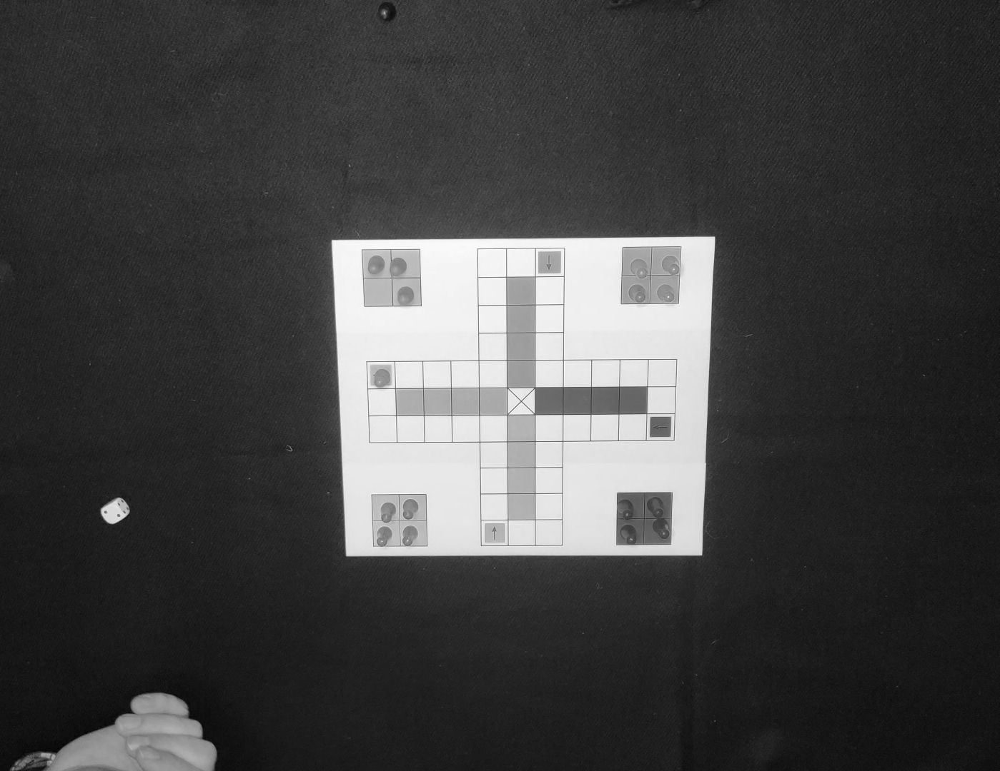

In [14]:
dice_test = cv2.imread("/content/TEST_D/TEST_D1.jpg")
dice_test_gray = cv2.cvtColor(dice_test, cv2.COLOR_RGB2GRAY)
imshow(dice_test_gray)

In [15]:
dice_cascade = cv2.CascadeClassifier('/content/cascade.xml')
found = dice_cascade.detectMultiScale(dice_test_gray, scaleFactor=1.3,
                                              minNeighbors=15,
                                              flags=cv2.CASCADE_SCALE_IMAGE)
amount_found = len(found)

In [16]:
print(amount_found)

2


In [17]:
dice_test2 = dice_test.copy()

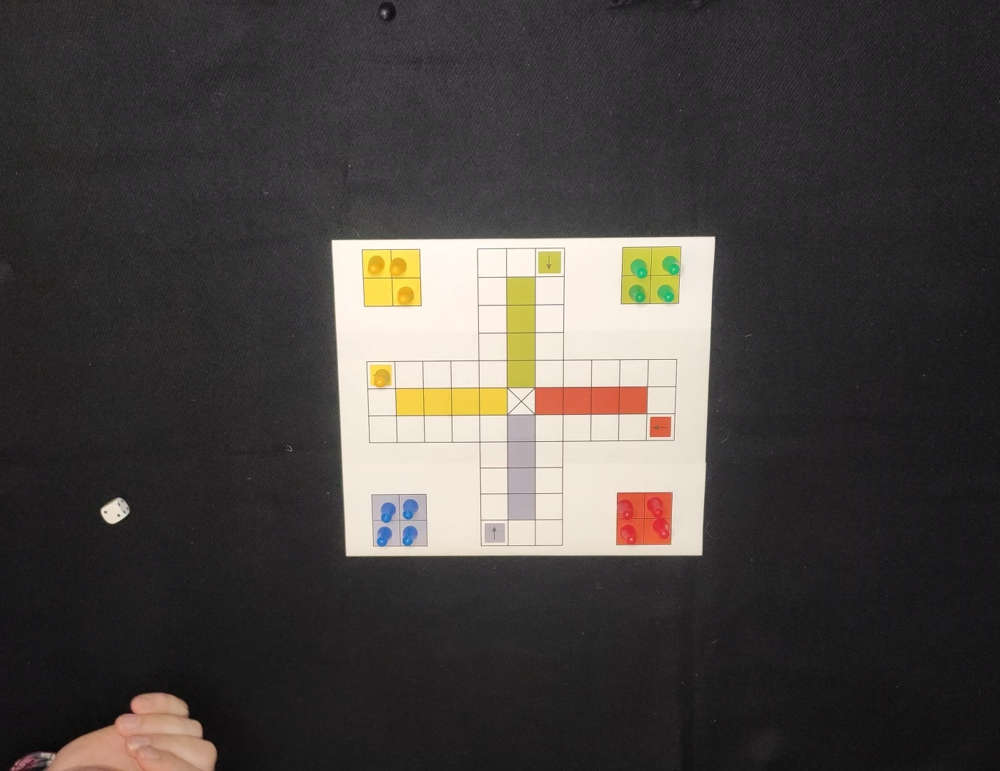

In [18]:
imshow(dice_test2)

In [19]:
max_size = min(dice_test_gray.shape[0], dice_test_gray.shape[1]) /5   # to avoid detecting board as a dice we set a max size of a dice, its max size will probably be even smaller but for now we set it as this

if amount_found != 0:

    # There may be more than one
    # sign in the image
    for (x, y, width, height) in found:

        if width < max_size and height < max_size:

          # We draw a green rectangle around
          # every recognized sign
          cv2.rectangle(dice_test2, (x, y),
                        (x + height, y + width),
                        (0, 255, 0), 5)

#### Outcome

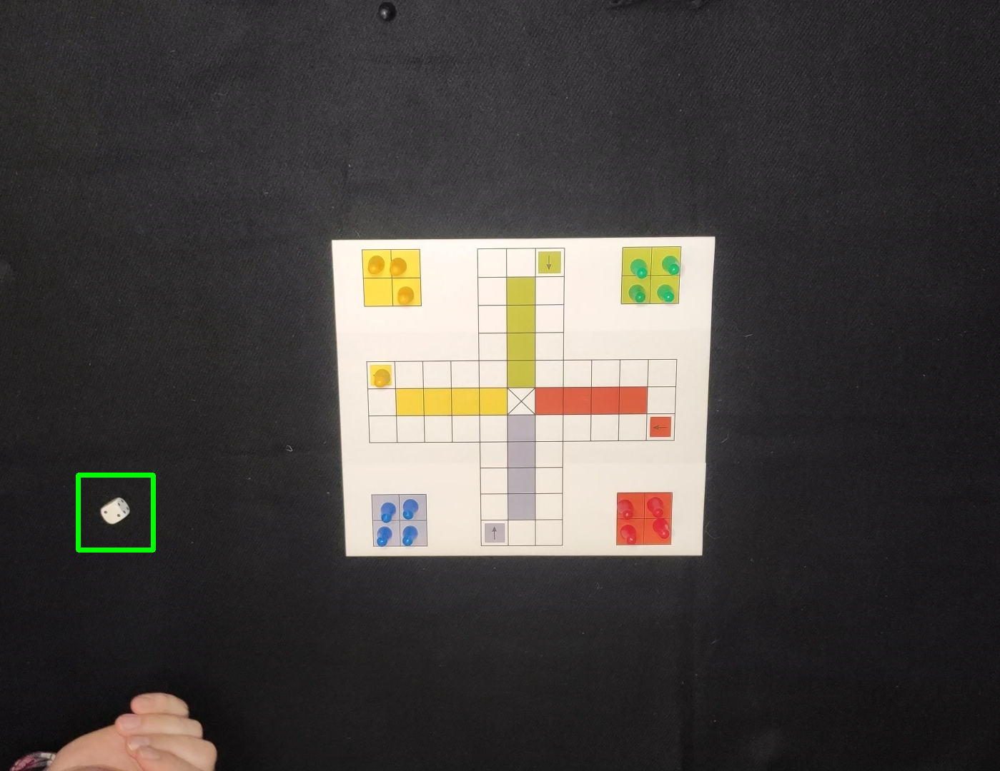

In [20]:
imshow(dice_test2)

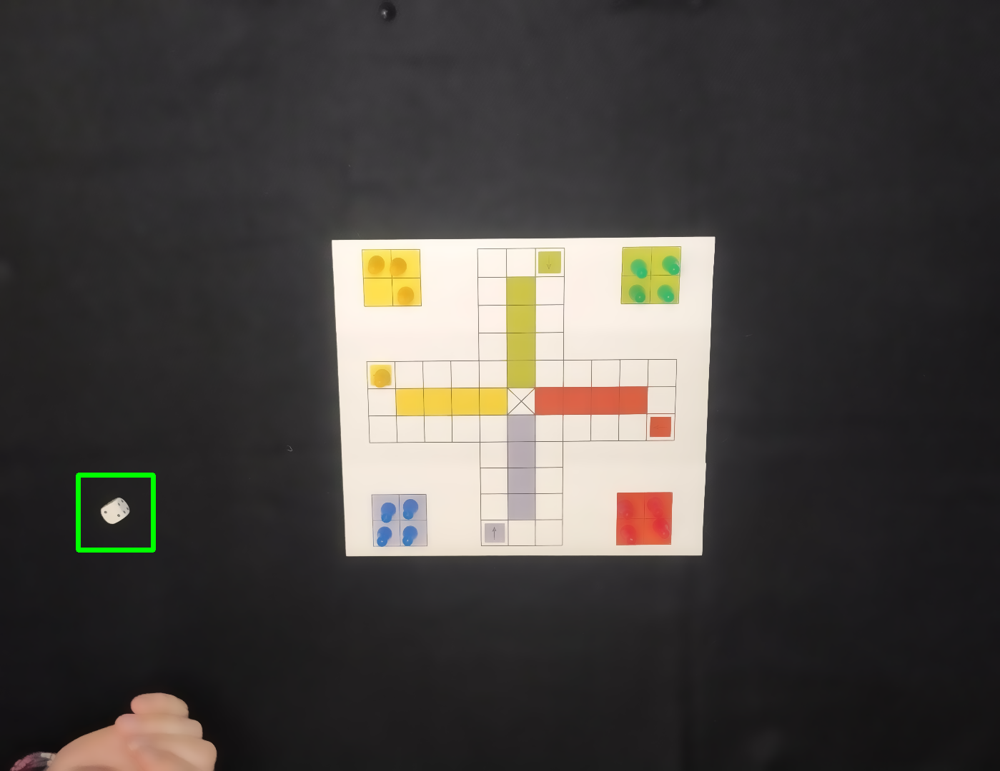

In [21]:
imshow( cv2.bilateralFilter(dice_test2, 20, 75, 75) )

### Test - proccess_frame function

let's put it in a function

In [22]:
def find_dice(img):
  dice_cascade = cv2.CascadeClassifier('/content/cascade.xml')
  dice_test_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
  dice_test_gray = cv2.bilateralFilter(dice_test_gray, 20, 75, 75)
  found = dice_cascade.detectMultiScale(dice_test_gray, scaleFactor=1.3,
                                                minNeighbors=15,
                                                flags=cv2.CASCADE_SCALE_IMAGE)
  amount_found = len(found)

  max_size = min(dice_test_gray.shape[0], dice_test_gray.shape[1]) /10   # to avoid detecting board as a dice we set a max size of a dice, its max size will probably be even smaller but for now we set it as this

  min_size = min(dice_test_gray.shape[0], dice_test_gray.shape[1]) /18


  dice_test = img.copy()

  if amount_found != 0:

      for (x, y, width, height) in found:

          if width < max_size and height < max_size and width > min_size and height > min_size:

            cv2.rectangle(dice_test, (x, y),
                          (x + height, y + width),
                          (0, 255, 0), 5)
  return dice_test

In [23]:
def proccess_frame(frame):
    modified_frame = find_dice(frame)

    return modified_frame

In [24]:
dice_test3 = dice_test.copy()

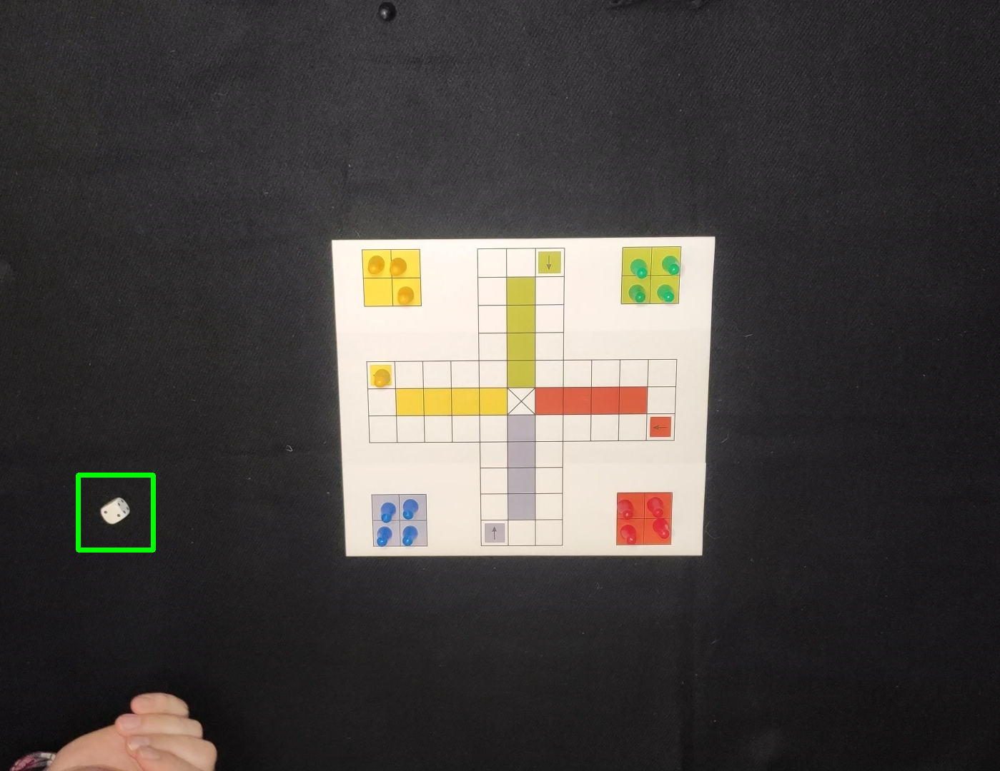

In [25]:
imshow(proccess_frame(dice_test3))

#### Guess number

https://github.com/aaskay/CountingDicePips/blob/master/CountDicePips.py

In [26]:
# -*- coding: utf-8 -*-
"""
Created on Fri Apr 20 09:49:01 2018

@author: Allen Askay
"""
import os
import numpy as np
import cv2
from matplotlib import pyplot as plt

# def CountDicePips(inputPath,outputPath,image):
def CountDicePips(img,outputPath,image):
    """ Count the number of pips on one or more dice in an image file.

    Parameters:
        inputPath (string): Path to the source image file.
        outputPath (string): Path to the image output location.
        image (string): Name of the image to process.

    Returns:
        Does not return a value.
        The function outputs a copy of the original image annotated with the
        sum of all pips found on all dice as well as the number of pips on
        each dice next to the dice.
    """
    # Read in an image and correct for colorspace
    # path = os.path.join(inputPath,image)
    # if os.path.isfile(path):
    #     img = cv2.imread(path)
    #     img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # else:
    #     print("No image file found")
    #     return

    # Create a greyscale version of the image
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

    # Threshold the image
    ret,thresh = cv2.threshold(gray,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

    # Get the contours of the dice
    contours,_ = cv2.findContours(thresh.copy(),cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
    cnts = sorted(contours,key=cv2.contourArea,reverse=True)

    sum_dots = 0
    for c in cnts:
        print("a")
        # Approximate the contours found above and find the area
        approx = cv2.approxPolyDP(c,0.04*cv2.arcLength(c,True),True)
        area = cv2.contourArea(c)

        if ((len(approx)==4) & (area > 10)): # square contour
            print("a")
            cv2.drawContours(img,[c],0,(0,255,0),3)

            # Find the set of points that 'cover' the die to find the ROI
            rect = cv2.minAreaRect(c)
            box = cv2.boxPoints(rect)
            box = np.int0(box)

            # Get the region of interest (for the particular die)
            center = ComputeContourCenter(c)
            size = ComputeBoxSize(box)
            roi = cv2.getRectSubPix(gray,size,center)

            # Count the pips on the die
            params = cv2.SimpleBlobDetector_Params()

            # Filter by Circularity
            params.filterByCircularity = True
            params.minCircularity = 0.5

            # Filter by Inertia
            params.filterByInertia = True
            params.minInertiaRatio = 0.75

            detector = cv2.SimpleBlobDetector_create(params)
            keypoints = detector.detect(roi)
            num_dots = len(keypoints)

            # Calculate an offset for labeling the number of pips by each die
            locationX = int(center[0]+size[0]/2)
            locationY = int(center[1]+size[1]/2)
            location = (locationX,locationY)

            # Label the image and accumulate the total number of pips
            cv2.putText(img,str(num_dots),location,0,1.75,(0,255,0), 3, cv2.LINE_AA)
            sum_dots += num_dots

    text = 'Sum: ' + str(sum_dots)
    print(text)
    cv2.putText(img,text,(25,50),0,1.75,(0,255,0), 4, cv2.LINE_AA)

    # Plot the result
    plt.imshow(img),plt.show()

    # outputName = 'output_'+image
    # if not os.path.exists(outputPath):
    #     os.makedirs(outputPath)

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # cv2.imwrite(os.path.join(outputPath,outputName),img)
    return img, sum_dots


def ComputeContourCenter(contour):
    """ This function takes in an OpenCV contour object
    and returns the center of the contour by using the
    OpenCV moments function.
    """
    M = cv2.moments(contour)
    cX = int(M["m10"] / M["m00"])
    cY = int(M["m01"] / M["m00"])
    center = (cX,cY)
    return center

def ComputeBoxSize(box):
    """ This function takes in an OpenCV boxPoints
    array and returns the size of the box."""
    Xs = [i[0] for i in box]
    Ys = [i[1] for i in box]
    x1 = min(Xs)
    x2 = max(Xs)
    y1 = min(Ys)
    y2 = max(Ys)
    size = (x2-x1, y2-y1)
    return size

In [27]:
def dice_perspective_transform(image):
    scale_percent = 500  # Rescale to 50% for better detail
    width = int(image.shape[1] * scale_percent / 100)
    height = int(image.shape[0] * scale_percent / 100)
    dim = (width, height)

    resized = cv2.resize(image, dim, interpolation=cv2.INTER_AREA)
    gray = cv2.cvtColor(resized, cv2.COLOR_BGR2GRAY)

    # Adaptive thresholding (keep dice white, background black)
    thresh = cv2.adaptiveThreshold(
        gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2
    )

    gray = cv2.cvtColor(resized,cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, 100, 200)

    imshow(edges)


    # Find contours to isolate the dice
    contours, _ = cv2.findContours(
        edges.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
    )
    dice_contours = []
    for i, c in enumerate(contours):
      area = cv2.contourArea(c)
      print(f"Contour {i} Area: {area}")
      cv2.drawContours(resized, [c], -1, (255, 0, 0), 1)
      imshow(resized)  # Show each contour as it's processed
    # for c in contours:
    #     area = cv2.contourArea(c)
    #     print(area)
    #     if 50 < area < 5000000:  # Filter based on reasonable dice size
    #         dice_contours.append(c)

    img_contours = resized.copy()
    cv2.drawContours(img_contours, dice_contours, -1, (36, 255, 12), 3)
    imshow(img_contours)

    num_dot = 0
    img_with_circles = resized.copy()

    for c in dice_contours:
        # Get bounding box of dice and isolate it
        x, y, w, h = cv2.boundingRect(c)
        roi = thresh[y : y + h, x : x + w]

        # Detect black dots using HoughCircles
        detected_circles = cv2.HoughCircles(
            roi,
            cv2.HOUGH_GRADIENT,
            dp=1.2,
            minDist=10,
            param1=50,
            param2=10,  # Lower for finer dot detection
            minRadius=3,
            maxRadius=15,
        )

        # Draw detected dots
        if detected_circles is not None:
            detected_circles = np.uint16(np.around(detected_circles))
            for pt in detected_circles[0, :]:
                a, b, r = pt[0], pt[1], pt[2]
                cv2.circle(img_with_circles, (x + a, y + b), r, (0, 255, 0), 2)
                cv2.circle(img_with_circles, (x + a, y + b), 1, (0, 0, 255), 3)
                num_dot += 1

    print(f"Total Dots Detected: {num_dot}")
    imshow(img_with_circles)

    return img_with_circles, num_dot


In [28]:
def dice_blob_detection(image):
    scale_percent = 500
    width = int(image.shape[1] * scale_percent / 100)
    height = int(image.shape[0] * scale_percent / 100)
    dim = (width, height)
    resized = cv2.resize(image, dim, interpolation=cv2.INTER_AREA)

    gray = cv2.cvtColor(resized, cv2.COLOR_BGR2GRAY)

    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    _, binary = cv2.threshold(blurred, 127, 255, cv2.THRESH_BINARY_INV)

    params = cv2.SimpleBlobDetector_Params()

    params.filterByArea = True
    params.minArea = 50
    params.maxArea = 1000

    params.filterByCircularity = True
    params.minCircularity = 0.7

    params.filterByConvexity = True
    params.minConvexity = 0.8

    params.filterByInertia = True
    params.minInertiaRatio = 0.5

    detector = cv2.SimpleBlobDetector_create(params)

    keypoints = detector.detect(binary)

    img_with_keypoints = cv2.drawKeypoints(
        resized,
        keypoints,
        np.array([]),
        (0, 0, 255),
        cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS,
    )

    imshow(img_with_keypoints)

    return img_with_keypoints, len(keypoints)

In [29]:
def find_dice(img):
  dice_cascade = cv2.CascadeClassifier('/content/cascade.xml')
  dice_test_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
  dice_test_gray = cv2.bilateralFilter(dice_test_gray, 20, 75, 75)
  found = dice_cascade.detectMultiScale(dice_test_gray, scaleFactor=1.3,
                                                minNeighbors=15,
                                                flags=cv2.CASCADE_SCALE_IMAGE)
  amount_found = len(found)

  max_size = min(dice_test_gray.shape[0], dice_test_gray.shape[1]) /10   # to avoid detecting board as a dice we set a max size of a dice, its max size will probably be even smaller but for now we set it as this

  min_size = min(dice_test_gray.shape[0], dice_test_gray.shape[1]) /18


  dice_test = img.copy()

  if amount_found != 0:

      for (x, y, width, height) in found:

          if width < max_size and height < max_size and width > min_size and height > min_size:

            cv2.rectangle(dice_test, (x, y),
                          (x + height, y + width),
                          (0, 255, 0), 5)

            # CountDicePips(img[y:y+height, x:x+width],"","")
            dice_found, num_dot = dice_perspective_transform(img[y:y+height, x:x+width])
            imshow(dice_found)
            print("Number of dots: ", num_dot)

  return dice_test

In [30]:
dice_test3 = dice_test.copy()

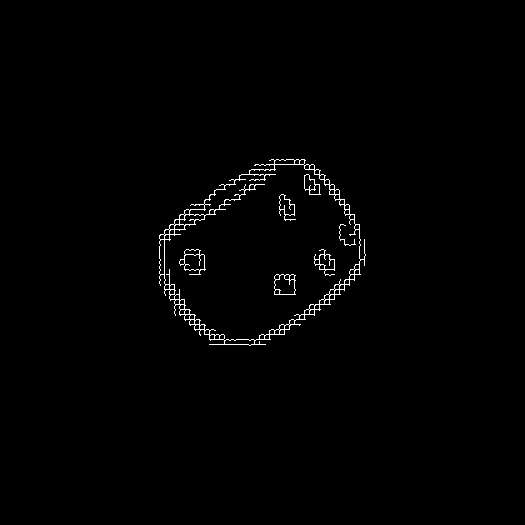

Contour 0 Area: 26420.5


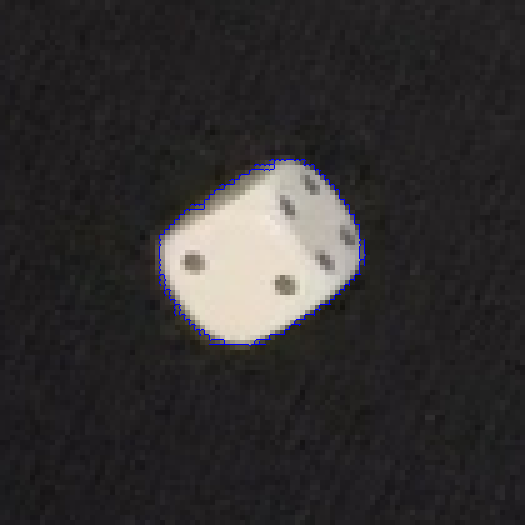

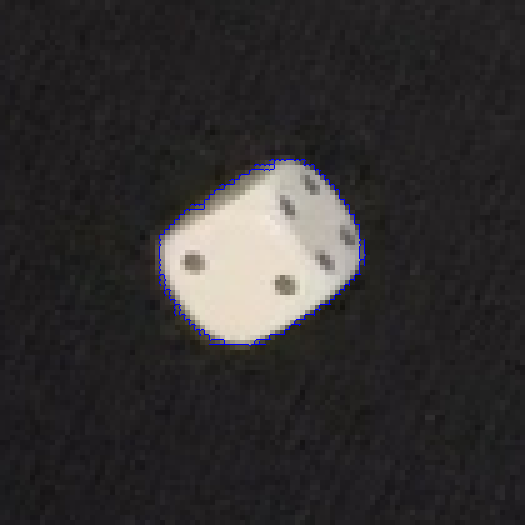

Total Dots Detected: 0


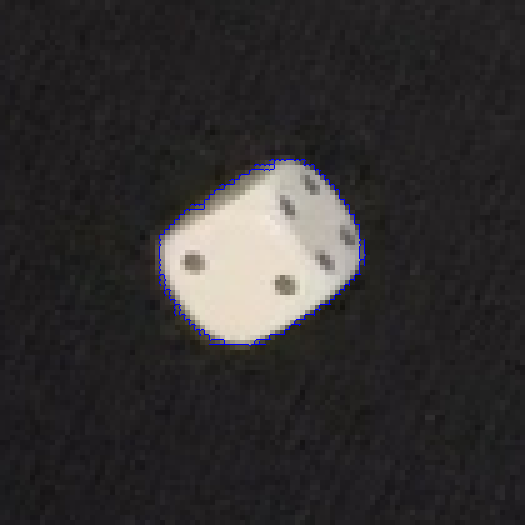

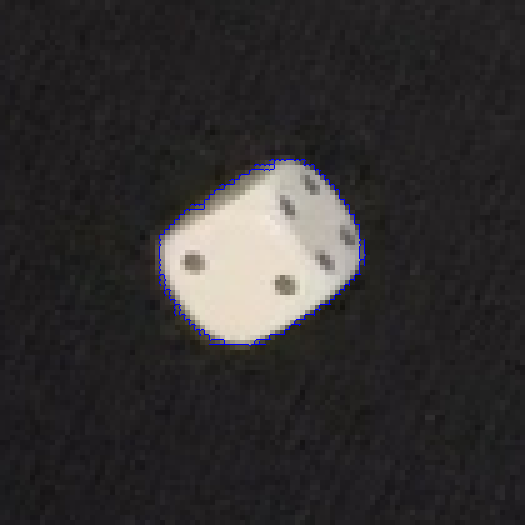

Number of dots:  0


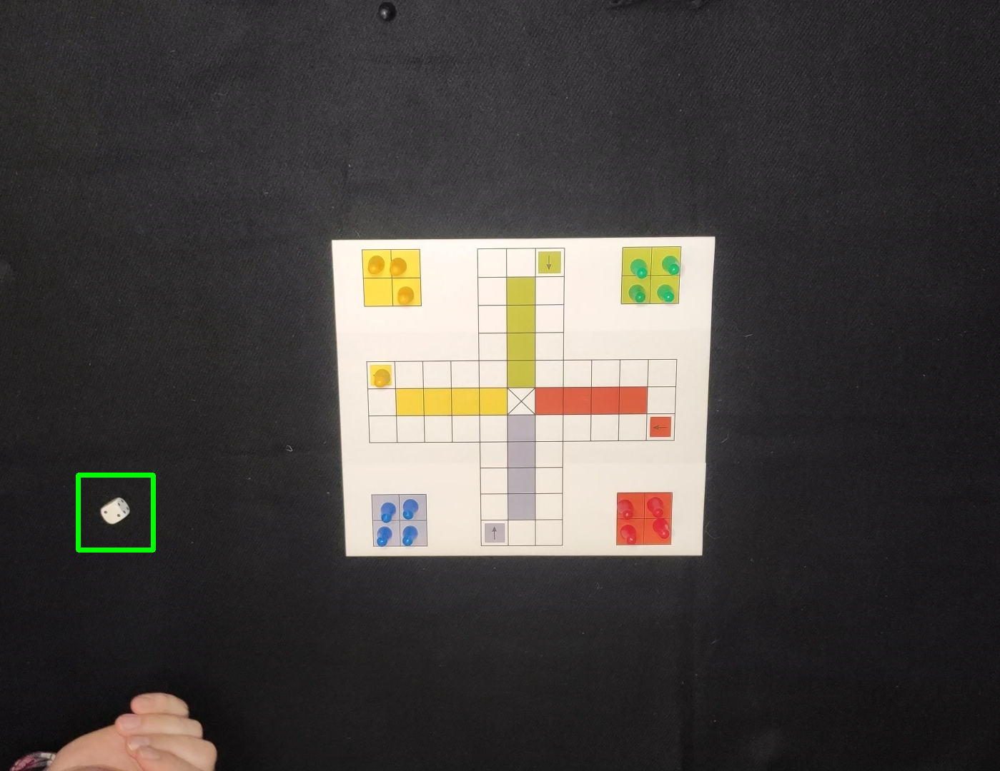

In [31]:
imshow(find_dice(dice_test3))

## Fix perspective

### Find, Crop and Transform

Finding corners and transforming from here:

https://stackoverflow.com/questions/71596075/how-to-detect-corners-of-a-square-with-python-opencv
https://www.appsloveworld.com/opencv/100/13/how-to-detect-game-board-in-image?expand_article=1

In [32]:
def perspective_transform(image, corners):
    def order_corner_points(corners):
        # separate corners into individual points
        # index 0 - top-right
        #       1 - top-left
        #       2 - bottom-left
        #       3 - bottom-right
        corners = [(corner[0][0], corner[0][1]) for corner in corners]
        top_r, top_l, bottom_l, bottom_r = corners[0], corners[1], corners[2], corners[3]
        return (top_l, top_r, bottom_r, bottom_l)

    # order points in clockwise order
    ordered_corners = order_corner_points(corners)
    top_l, top_r, bottom_r, bottom_l = ordered_corners

    # determine width of new image which is the max distance between
    # (bottom right and bottom left) or (top right and top left) x-coordinates
    width_a = np.sqrt(((bottom_r[0] - bottom_l[0]) ** 2) + ((bottom_r[1] - bottom_l[1]) ** 2))
    width_b = np.sqrt(((top_r[0] - top_l[0]) ** 2) + ((top_r[1] - top_l[1]) ** 2))
    width = max(int(width_a), int(width_b))

    # determine height of new image which is the max distance between
    # (top right and bottom right) or (top left and bottom left) y-coordinates
    height_a = np.sqrt(((top_r[0] - bottom_r[0]) ** 2) + ((top_r[1] - bottom_r[1]) ** 2))
    height_b = np.sqrt(((top_l[0] - bottom_l[0]) ** 2) + ((top_l[1] - bottom_l[1]) ** 2))
    height = max(int(height_a), int(height_b))

    square_size = min(width, height)
    square_size = 500
    # print((width, height))

    # construct new points to obtain top-down view of image in
    # top_r, top_l, bottom_l, bottom_r order
    # dimensions = np.array([[0, 0], [width - 1, 0], [width - 1, height - 1],
    #                 [0, height - 1]], dtype = "float32")

    dimensions = np.array([[0, 0], [square_size - 1, 0], [square_size - 1, square_size - 1],
                    [0, square_size - 1]], dtype="float32")

    # convert to numpy format
    ordered_corners = np.array(ordered_corners, dtype="float32")

    # find perspective transform matrix
    matrix = cv2.getPerspectiveTransform(ordered_corners, dimensions)

    # return the transformed image
    return cv2.warpPerspective(image, matrix, (square_size, square_size))

In [33]:
image = dice_test.copy()
original = image.copy()
horizontal_mask = np.zeros(image.shape, dtype=np.uint8)
vertical_mask = np.zeros(image.shape, dtype=np.uint8)
gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (3,3), 0)
thresh = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 23, 7)

cnts = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]

mask = np.zeros(image.shape, dtype=np.uint8)

cnt_found = False

for c in cnts:
    area = cv2.contourArea(c)
    peri = cv2.arcLength(c, True)
    approx = cv2.approxPolyDP(c, 0.015 * peri, True)

    if area > 15000 and len(approx) == 4:
        cnt_found = True
        cv2.drawContours(image,[c], 0, (36,255,12), 3)
        cv2.drawContours(mask,[c], 0, (255,255,255), -1)
        transformed = perspective_transform(original, approx)

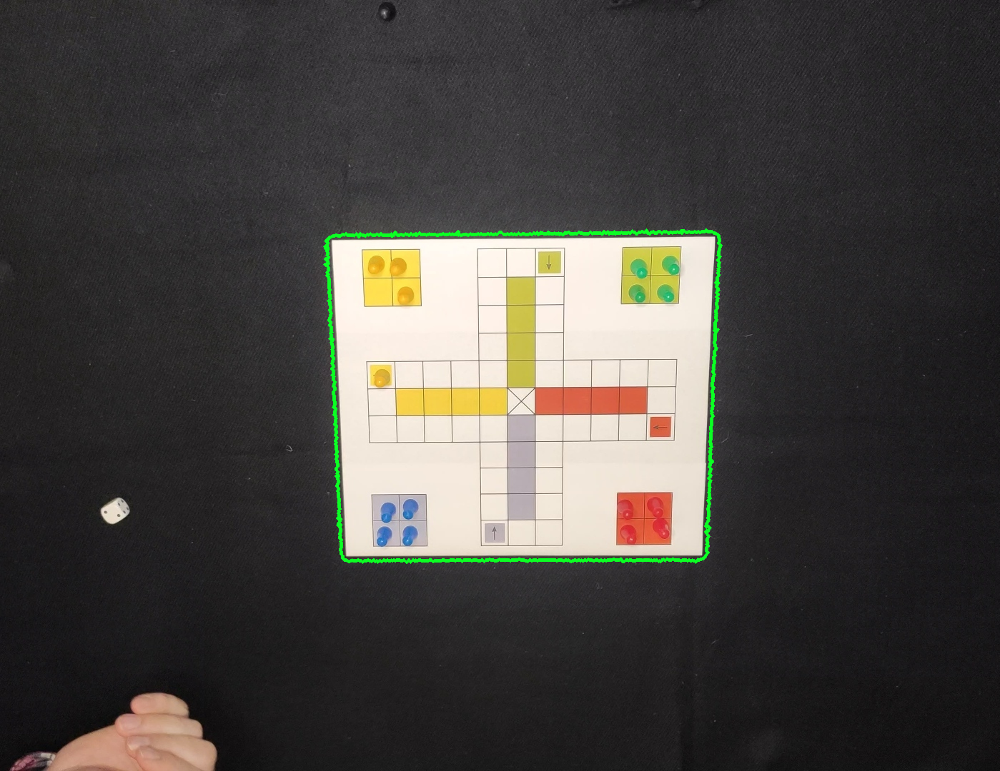

In [34]:
imshow(image)

so when the hand is covering the board the conture of the board is not found, we can add a flag which would tell us if the conture was found or not

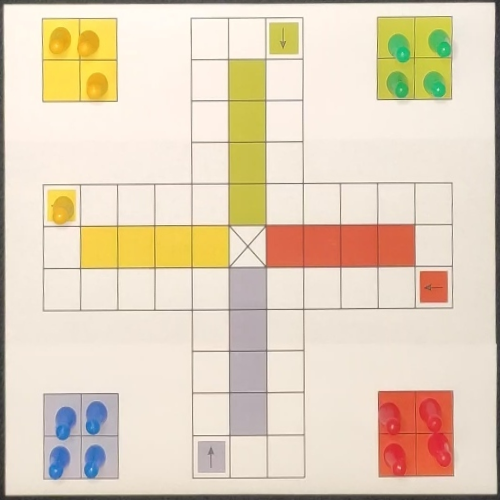

In [35]:
imshow(transformed.astype('uint8'))

### Find and Transform

ok so we have the board but we also want to have the whole img but straight, but to that we have to find the coordinants of the new edges of the sqare

In [36]:
def perspective_transform_all(image, corners):
    def order_corner_points(corners):
        # separate corners into individual points
        # index 0 - top-right
        #       1 - top-left
        #       2 - bottom-left
        #       3 - bottom-right
        corners = [(corner[0][0], corner[0][1]) for corner in corners]
        top_r, top_l, bottom_l, bottom_r = corners[0], corners[1], corners[2], corners[3]
        return (top_l, top_r, bottom_r, bottom_l)

    ordered_corners = order_corner_points(corners)
    top_l, top_r, bottom_r, bottom_l = ordered_corners

    original_corners = np.array(ordered_corners, dtype="float32")

    height, width = image.shape[:2]
    image_corners = np.array([
        [0, 0],
        [width - 1, 0],
        [width - 1, height - 1],
        [0, height - 1]
    ], dtype="float32")

    width_a = np.sqrt(((bottom_r[0] - bottom_l[0]) ** 2) + ((bottom_r[1] - bottom_l[1]) ** 2))
    width_b = np.sqrt(((top_r[0] - top_l[0]) ** 2) + ((top_r[1] - top_l[1]) ** 2))
    width = max(int(width_a), int(width_b))

    height_a = np.sqrt(((top_r[0] - bottom_r[0]) ** 2) + ((top_r[1] - bottom_r[1]) ** 2))
    height_b = np.sqrt(((top_l[0] - bottom_l[0]) ** 2) + ((top_l[1] - bottom_l[1]) ** 2))
    height = max(int(height_a), int(height_b))

    square_size = min(width, height)
    # print((width, height))
    square_size = 500

    # top_r, top_l, bottom_l, bottom_r order
    # dimensions = np.array([[0, 0], [width - 1, 0], [width - 1, height - 1],
    #                 [0, height - 1]], dtype = "float32")

    dimensions = np.array([[0, 0], [square_size - 1, 0], [square_size - 1, square_size - 1],
                    [0, square_size - 1]], dtype="float32")

    ordered_corners = np.array(ordered_corners, dtype="float32")

    matrix = cv2.getPerspectiveTransform(original_corners, dimensions)

    transformed_corners = cv2.perspectiveTransform(image_corners[np.newaxis, :, :], matrix)[0]
    # print(transformed_corners)

    min_x = int(min(transformed_corners[:, 0]))
    max_x = int(max(transformed_corners[:, 0]))
    min_y = int(min(transformed_corners[:, 1]))
    max_y = int(max(transformed_corners[:, 1]))

    shift_x = -min_x if min_x < 0 else 0
    shift_y = -min_y if min_y < 0 else 0

    new_width = max_x - min_x
    new_height = max_y - min_y

    # print(max_x, max_y, min_x, min_y)
    # print(shift_x, shift_y)

    translation_matrix = np.array([
        [1, 0, shift_x],
        [0, 1, shift_y],
        [0, 0, 1]
    ], dtype="float32")
    adjusted_matrix = np.dot(translation_matrix, matrix)

    transformed_image = cv2.warpPerspective(image, adjusted_matrix, (new_width, new_height))
    transformed_corners2 = cv2.perspectiveTransform(image_corners[np.newaxis, :, :], adjusted_matrix)


    transformed_corners2_int = np.round(transformed_corners2[0]).astype(int)
    transformed_corners2_int[transformed_corners2_int < 0] = 0
    # print(transformed_corners2_int)
    sorted_corners = transformed_corners2_int[np.argsort(transformed_corners2_int[:, 0])]
    # print("Sorted corners:", sorted_corners)
    # print(sorted_corners.shape)
    # print(sorted_corners[2][0])

    y_min = max(sorted_corners[1][1], sorted_corners[2][1])
    y_max = min(sorted_corners[0][1], sorted_corners[3][1])
    x_min = max(sorted_corners[0][0], sorted_corners[1][0])
    x_max = min(sorted_corners[2][0], sorted_corners[3][0])

    cropped_image = transformed_image[y_min:y_max, x_min:x_max]
    # print(y_min, y_max, x_min, x_max)

    # scaled_image = cv2.resize(cropped_image, (cropped_image.shape[1] // 2, cropped_image.shape[0] // 2))

    return cropped_image.astype('uint8')

In [37]:
def img_transform(image):
  original = image.copy()
  horizontal_mask = np.zeros(image.shape, dtype=np.uint8)
  vertical_mask = np.zeros(image.shape, dtype=np.uint8)
  gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
  blur = cv2.GaussianBlur(gray, (3,3), 0)
  thresh = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 23, 7)

  cnts = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  cnts = cnts[0] if len(cnts) == 2 else cnts[1]

  mask = np.zeros(image.shape, dtype=np.uint8)

  cnt_found = False

  for c in cnts:
      area = cv2.contourArea(c)
      peri = cv2.arcLength(c, True)
      approx = cv2.approxPolyDP(c, 0.015 * peri, True)

      if area > 1500 and len(approx) == 4:
          # print("some")
          # print(area, len(approx))
          cnt_found = True
          cv2.drawContours(image,[c], 0, (36,255,12), 3)
          cv2.drawContours(mask,[c], 0, (255,255,255), -1)
          return perspective_transform_all(original, approx), perspective_transform(original, approx)
  return image.astype('uint8'), image.astype('uint8')

In [38]:
image = dice_test.copy()
transformed, _ = img_transform(image)

In [39]:
print(transformed.shape)

(1185, 1216, 3)


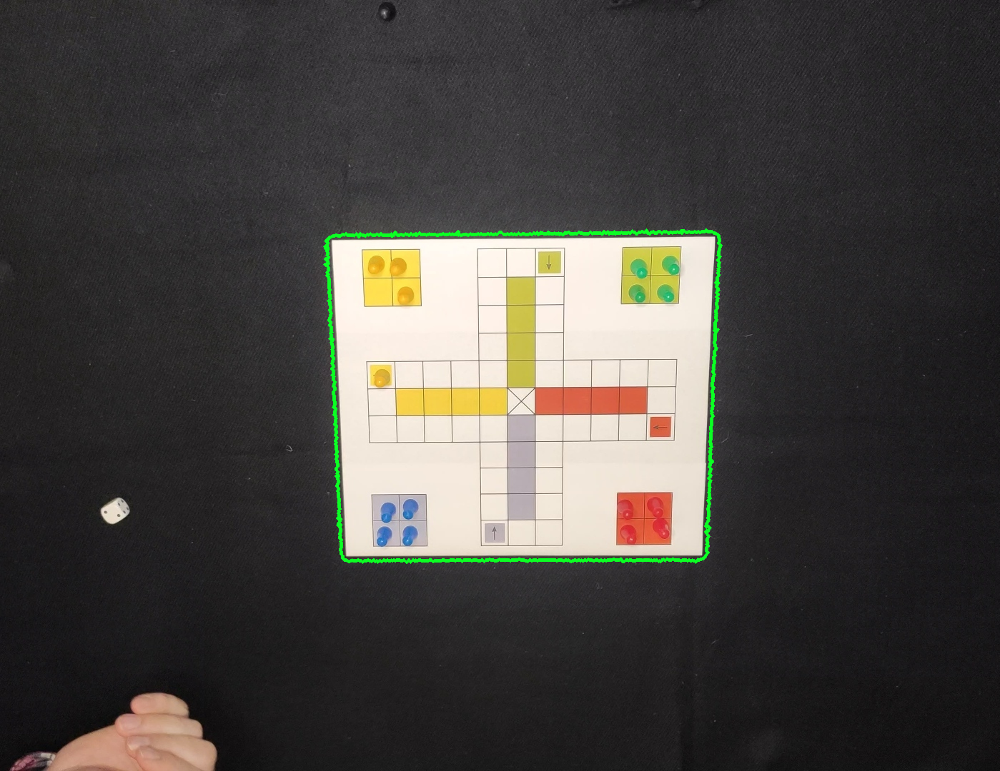

In [40]:
imshow(image)

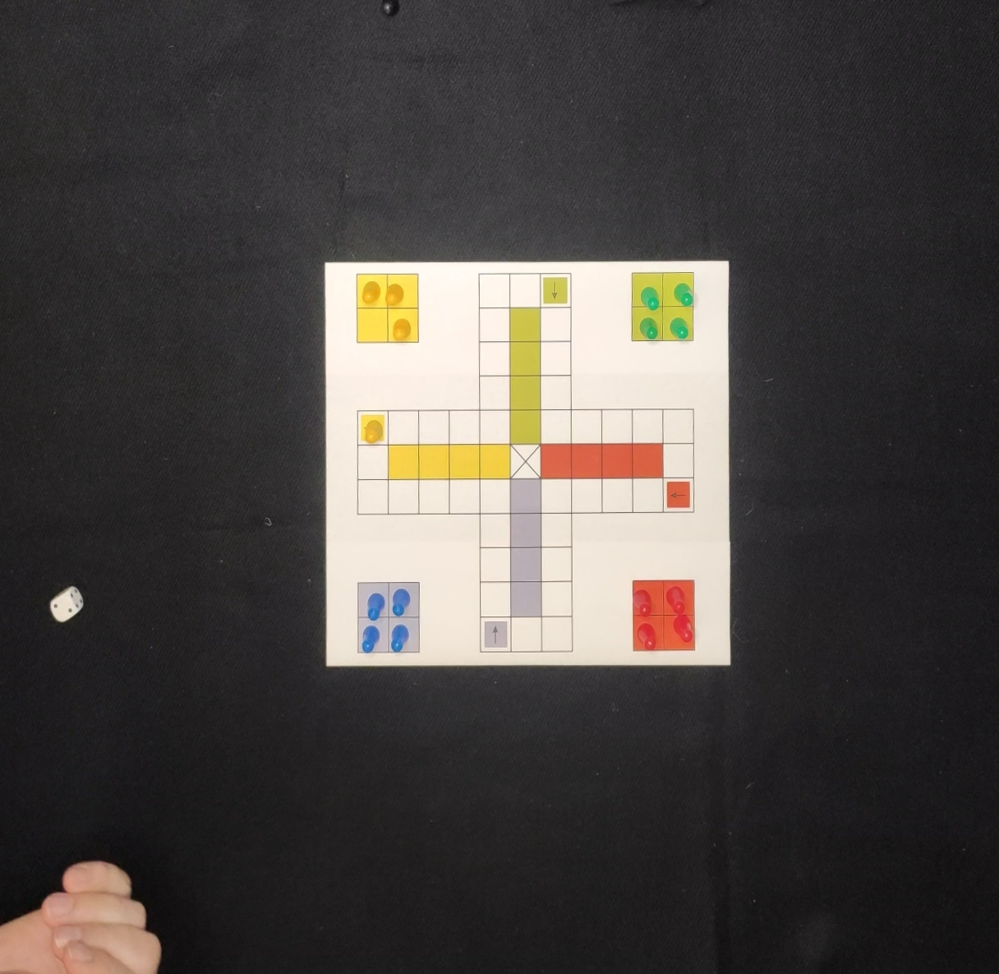

In [41]:
imshow(transformed.astype('uint8'))

now we have perfected extracted the background

we also return the matrix and the coordinants of the edges co we can use them in other images ( for example when the board is not found )

## Board

In [42]:
image = dice_test.copy()
_, board = img_transform(image)

## Test video

In [43]:
!rm -rf ./videos
!mkdir videos


In [44]:
!wget -O videos/s1.mp4 https://raw.githubusercontent.com/senketsutsu/CHINCZYK-cv/main/video/s1.mp4 -q --show-progress
!wget -O videos/s2.mp4 https://raw.githubusercontent.com/senketsutsu/CHINCZYK-cv/main/video/s2.mp4 -q --show-progress
!wget -O videos/s3.mp4 https://raw.githubusercontent.com/senketsutsu/CHINCZYK-cv/main/video/s3.mp4 -q --show-progress

videos/s1.mp4       100%[===================>]   6.57M  --.-KB/s    in 0.1s    
videos/s2.mp4       100%[===================>]  17.36M   113MB/s    in 0.2s    
videos/s3.mp4       100%[===================>]  14.20M  --.-KB/s    in 0.1s    


In [45]:
!wget -O videos/m1.mp4 https://raw.githubusercontent.com/senketsutsu/CHINCZYK-cv/main/video/m1.mp4 -q --show-progress
!wget -O videos/m2.mp4 https://raw.githubusercontent.com/senketsutsu/CHINCZYK-cv/main/video/m2.mp4 -q --show-progress
!wget -O videos/m3.mp4 https://raw.githubusercontent.com/senketsutsu/CHINCZYK-cv/main/video/m3.mp4 -q --show-progress

videos/m1.mp4       100%[===================>]  11.39M  --.-KB/s    in 0.1s    
videos/m2.mp4       100%[===================>]   1.18M  --.-KB/s    in 0.07s   
videos/m3.mp4       100%[===================>]   5.47M  --.-KB/s    in 0.09s   


In [46]:
!wget -O videos/h1.mp4 https://raw.githubusercontent.com/senketsutsu/CHINCZYK-cv/main/video/h1.mp4 -q --show-progress
!wget -O videos/h2.mp4 https://raw.githubusercontent.com/senketsutsu/CHINCZYK-cv/main/video/h2.mp4 -q --show-progress
!wget -O videos/h3.mp4 https://raw.githubusercontent.com/senketsutsu/CHINCZYK-cv/main/video/h3.mp4 -q --show-progress

videos/h1.mp4       100%[===================>]  20.69M  --.-KB/s    in 0.1s    
videos/h2.mp4       100%[===================>]  16.46M   109MB/s    in 0.2s    
videos/h3.mp4       100%[===================>]   7.83M  --.-KB/s    in 0.1s    


In [47]:
Video.from_file("videos/s1.mp4")

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00h\xe2\xb0mdat\x00\x…

In [48]:
Video.from_file("videos/m1.mp4")

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x82\x94moov\x00\x00\x00lmvhd\x00\x…

In [49]:
Video.from_file("videos/h1.mp4")

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\xa3\xc4moov\x00\x00\x00lmvhd\x00\x…

In [50]:
def find_dice(img):
  dice_cascade = cv2.CascadeClassifier('/content/cascade.xml')
  dice_test_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
  dice_test_gray = cv2.bilateralFilter(dice_test_gray, 20, 75, 75)
  found = dice_cascade.detectMultiScale(dice_test_gray, scaleFactor=1.3,
                                                minNeighbors=15,
                                                flags=cv2.CASCADE_SCALE_IMAGE)
  amount_found = len(found)

  max_size = min(dice_test_gray.shape[0], dice_test_gray.shape[1]) /5   # to avoid detecting board as a dice we set a max size of a dice, its max size will probably be even smaller but for now we set it as this

  min_size = min(dice_test_gray.shape[0], dice_test_gray.shape[1]) /20


  dice_test = img.copy()

  if amount_found != 0:

      for (x, y, width, height) in found:

          if width < max_size and height < max_size and width > min_size and height > min_size:

            cv2.rectangle(dice_test, (x, y),
                          (x + height, y + width),
                          (0, 255, 0), 5)
            return dice_test, x, y, width, height
  return dice_test, 0,0,0,0

In [51]:
def proccess_frame(frame):
  image = frame.copy()
  transformed, board = img_transform(image)

  modified_frame2, x, y, width, height = find_dice(frame)


  return modified_frame2, board

In [1]:
def process_video(input_video_path, output_video_path, output_video_path_board):

    cap = cv2.VideoCapture(input_video_path)


    frame_width = int(cap.get(3))
    frame_height = int(cap.get(4))


    frame_fps = cap.get(cv2.CAP_PROP_FPS)
    fourcc = cv2.VideoWriter_fourcc(*'XVID')
    out = cv2.VideoWriter(output_video_path,
                          cv2.VideoWriter_fourcc(*"DIVX"),
                          frame_fps,
                          (frame_width, frame_height),)
    out_board = cv2.VideoWriter(output_video_path_board,
                          cv2.VideoWriter_fourcc(*"DIVX"),
                          frame_fps,
                          (500, 500),)
    counter = 0

    while cap.isOpened():
        ret, frame = cap.read()

        if not ret:
            break

        modified_frame, board = proccess_frame(frame)

        out.write(modified_frame)
        out_board.write(board)

        if counter > 1000:
          break
        counter+=1

    cap.release()
    out.release()
    out_board.release()


    cv2.destroyAllWindows()


# input_video_path = 'videos/s1.mp4'
# output_video_path = 'dice_s1.avi'
# output_video_path_board = 'board_s1.avi'


# process_video(input_video_path, output_video_path, output_video_path_board)


In [66]:
!ffmpeg -hide_banner -loglevel error -i dice_s1.avi -y dice_s1.mp4
!ffmpeg -hide_banner -loglevel error -i board_s1.avi -y board_s1.mp4

In [69]:
Video.from_file("dice_s1.mp4")

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00]\x02\x9fmdat\x00\x…

In [68]:
Video.from_file("board_s1.mp4")

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00M\x96\xfemdat\x00\x…

In [70]:
input_video_path = 'videos/m1.mp4'
output_video_path = 'dice_m1.avi'
output_video_path_board = 'board_m1.avi'


process_video(input_video_path, output_video_path, output_video_path_board)

In [71]:
!ffmpeg -hide_banner -loglevel error -i dice_m1.avi -y dice_m1.mp4
!ffmpeg -hide_banner -loglevel error -i board_m1.avi -y board_m1.mp4

In [72]:
Video.from_file("dice_m1.mp4")

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00?\x0c;mdat\x00\x00\…

In [73]:
Video.from_file("board_m1.mp4")

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00Ku\xecmdat\x00\x00\…

In [ ]:
input_video_path = 'videos/h1.mp4'
output_video_path = 'dice_h1.avi'
output_video_path_board = 'board_h1.avi'


process_video(input_video_path, output_video_path, output_video_path_board)

In [ ]:
!ffmpeg -hide_banner -loglevel error -i dice_h1.avi -y dice_h1.mp4
!ffmpeg -hide_banner -loglevel error -i board_h1.avi -y board_h1.mp4

In [ ]:
Video.from_file("dice_h1.mp4")

In [ ]:
Video.from_file("board_h1.mp4")